## New forecasting model for prescribing costs

We need to create a forecasting model to predict primary care prescribing costs.

To do this, I want to forecast (using Google Big Query's ML forecasting tool) the total quantity of medicines til the end of the financial year.  We can then retro-fit prices for this, using the latest available costs.

I've already undertaken experiments to create a single price list of medicines over time.  They're in `forecasting.py`



Initially, we'll do the following:
- Use a single date as a first test of concept
- Choose simple proportion for the number of drugs (maybe, for beginning, ALL drugs that have a price and are in acceptable ranges)
- Have a 3 year period for forecasting
- Don't worry about exogenous factors
- Do one calculation for Devon ICB only

In the future, once there's a succesful model working, we can attempt more complicated things like:

- [ ] Try multiple dates through an iteration, to see how accuracy changes (and compared with existing model)

- [ ] Try multiple proportions (e.g. 25%, 50%, 75% etc) to see if forecasting actually improves with fewer things <span style="color: red">*or running the whole dataset (that matches bnf_codes) and slicing locally in Pandas*</span>

- [ ] Try different lengths for forecasting

- [ ] Consider exogenous factors, e.g. working days, to see if that improves it

- [ ] Try running for multiple ICBs, to see if that will work (via a `CONCAT` of `icb_code` and `bnf_code`)



### Step 1: initial settings

Let's load what we need, including our `forecasting.py` library:

In [1]:
import pandas as pd
import numpy as np
import os
from ebmdatalab import bq
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from time import time
from workalendar.europe import UnitedKingdom

from google.cloud import bigquery
from google.oauth2 import service_account

# Load credentials from the service account file for non-query related stuff (i.e. ML)
bq_file = os.path.join("..","bq-service-account.json") # defines name for cache file
credentials = service_account.Credentials.from_service_account_file(bq_file)

# Initialize BigQuery client with credentials
client = bigquery.Client(credentials=credentials, project=credentials.project_id)

# Load function definitions
%run forecasting.py

Next, we need to define what we think some variables are going to be.

The prescribing data for 2024-25 is now complete, so we should think about using that.

For our first attempt, let's use a mid-year data point.  We often get asked about forecasting in October time, which will have August data available.  Therefore, let's assume that
- **3 year** forecasting period
- Forecast through til the end of 24-25 (i.e. **March 2025** data, or **7 points**) - *we have `financial_year_end` defined to help us with this*
- Therefore 3 year forecasting period will be **September 2021** - **August 2024** - *we have `start_training` and `end_training` defined to help us with this*

In [2]:
#set dates for training data
start_forecast = '2024-09-01' # in final model this will be one month after latest available data, for testing purposes this can be changed
end_forecast = financial_year_end(start_forecast) # the end of the financial year the forecast relates to *USES financial_year_end FUNCTION*
forecast_months = forecast_months_count(start_forecast, end_forecast) # gives us the number of months needed to forecast 
training_months = 36 # how many months we want the AutoARIMA training model to use
start_training = start_training_date(start_forecast, training_months) #  month for the start of the training model *USES start_training_date FUNCTION*
end_training = end_training_date(start_forecast) # end of the training model (usually the last month of data available)

Let's just check we've got those correct:

In [3]:
print("Start Forecast ", start_forecast)
print("End Forecast ", end_forecast)
print("Number of months to forecast: ", forecast_months)
print("Training months ", training_months)
print("Start of training model ", start_training)
print("End of training model ", end_training)

Start Forecast  2024-09-01
End Forecast  2025-03-01 00:00:00
Number of months to forecast:  7
Training months  36
Start of training model  2021-09-01 00:00:00
End of training model  2024-08-01 00:00:00


We also need to think about other variables for testing the mode.

- For the model we need to set an end date for pricing data. Here we will assume that the date is **two months** ahead of the prescribing data - for the model this will be **October 2024** *(in final model this would be a function to find date of latest pricing data)*
- Sometimes there's some weird discrepancy between expected and actual unit prices.  This is often due to things like pack sizes (e.g. inhalers 200 dose vs one inhaler).  We can set a limit to filter these out (multiplying by both x and 1/x).  Here we'll try for **50**.
- We need to also set a proportion of the "top" BNF codes to use - this is less problematic with BQ ML AutoARIMA than a local service, as it's much quicker.  The number increasingly exponentially with increasing percentage.  For initial tests we will set at 80% and see how that works.

In [4]:
# set variables for test modelling
latest_pricing_data = pd.to_datetime(start_forecast) + pd.DateOffset(months=1) # assume that pricing data is usually two months ahead of prescribing data for testing purposes - in final model this would be a function to find date of latest pricing data
multiplier_limit = 50 # Define limits for filtering out unexpected actual vs expected price per unit (both x and 1/x multipliers)
top_x_percent = 30  # Define the top x% of BNF codes (for both items and costs) to use at BNF code level forecasting
#current_fy = financial_year_start(start_forecast) # Calculate start of financial year

Let's also check we've got those correct:

In [5]:
print("Pricing data end ", latest_pricing_data)
print("Multiplier limit ", multiplier_limit)
print("Proportion of BNF codes to forecast: ", top_x_percent)

Pricing data end  2024-10-01 00:00:00
Multiplier limit  50
Proportion of BNF codes to forecast:  30


OK, now we've set these, let's start by getting pricing data

### Step 2: calculate prices



There are two main parts to getting the list price data:
1. Generic prices
2. Brand prices

We need both, and we need them in a tablulated form with monthly prices, e.g.

<div style="float: left;">
    
|    month   |    bnf_code   | price(£) |   |   |
|:----------:|:-------------:|:--------:|---|---|
| 2024-01-01 | 0208020AAABAB | 3.45     |   |   |
| 2024-02-01 | 0208020AAABAB | 3.32     |   |   |

</div>

<div style="clear: both;"></div>

**Generic** prices are relatively easy - in effect, we need to pull them from the existing monthly data we hold on OpenPrescribing, they're already in a tabulated list.

**Brand** prices are more complicated - OP doesn't have a monthly price list.  We do have a `dm+d` entry, which has a price, and previous price and date.  We'll need to create a function to deal with that.

We'll also need to deal with discount, these have recently changed, but in effect *generics* are discounted by 5%, *brands* by 20% (with some exceptions).

Let's go through the steps to get a single, monthly tabulated price list that we can use:


#### 2a: generic prices

As stated above, generic prices are the easy bit.  We just need to pull what we need in from BigQuery into a DataFrame.  We'll limit the time period to the training and forecast periods (<span style="color: red">*and do we need the training periods, i'll need to think about that*</span>)

We also need to take account of price concession prices, and pull them in where we have them.

We also need to define a couple things in this, to change the data slightly:
- ensure that inhalers show as "one pack", not "200 doses"
- change "litres" to "mililitres"

In [6]:
# define SQL for getting dt data from BigQuery
# this gets dt data, and adds price concession data where it exists for a VMPP and date.  It only gets data between the start data and end forecast variables defined above.

start_training_str = start_training.strftime('%Y-%m-%d')
end_forecast_str = end_forecast.strftime('%Y-%m-%d')

sql = f""" 
SELECT
  dt.date AS month,
  dt.vmpp AS vmpp,
  vmpp.bnf_code AS bnf_code,
  dt.price_pence AS price_pence,
  pc.price_pence AS pc_price_pence,
  dt.tariff_category AS dt_category,
  CASE
      WHEN vmpp.qty_uom = 3317411000001100 THEN 1 # where unit_of_measure is "dose" it uses 1, i.e. pack  - examples are salbutamol inhalers, where it returns 1 rather than 200
      WHEN vmpp.qty_uom = 258770004 THEN (vmpp.qtyval * 1000) # where unit_of_measure is "litre", it multiplies qtyval by 1000 to convert to mililitres, which is how EPD data is shown
      ELSE vmpp.qtyval END AS qtyval
FROM
  dmd.tariffprice AS dt
INNER JOIN
  dmd.vmpp AS vmpp
ON
  dt.vmpp = vmpp.id
LEFT OUTER JOIN
  dmd.ncsoconcession AS pc
ON
  dt.vmpp = pc.vmpp
  AND dt.date = pc.date
WHERE dt.date BETWEEN '{start_training_str}' AND '{end_forecast_str}'
"""
exportfile = os.path.join("..","data","dt_price_df.csv") # defines name for cache file
dt_raw_df = bq.cached_read(sql, csv_path=exportfile, use_cache=True) # uses BQ if changed, otherwise csv cache file
dt_raw_df['price_per_unit'] = dt_raw_df['price_pence']/dt_raw_df['qtyval'] # create price per unit column for dt data
dt_raw_df['pc_price_per_unit'] = dt_raw_df['pc_price_pence']/dt_raw_df['qtyval'] # create price per unit column for dt data
dt_raw_df['month'] = pd.to_datetime(dt_raw_df['month']) # ensure month data is datetime format
dt_raw_df['price_per_unit'] = dt_raw_df['price_per_unit'].astype(float) # ensure ppu is in float
dt_raw_df['pc_price_per_unit'] = dt_raw_df['pc_price_per_unit'].astype(float) # ensure ppu is in float

Downloading: 100%|█████████████████████████████████████████████████████████████|


Let's take a look at a sample of the download:

In [7]:
dt_raw_df.head(20)

,month,vmpp,bnf_code,price_pence,pc_price_pence,dt_category,qtyval,price_per_unit,pc_price_per_unit
0,2021-09-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
1,2021-10-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
2,2021-11-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
3,2021-12-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
4,2022-01-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
5,2022-02-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
6,2022-03-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
7,2022-04-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
8,2022-05-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN
9,2022-06-01,940911000001104,0204000R0AAALAL,588,<NA>,1,56.000000000,10.5,NaN


There is one issue we have to deal with when it comes to drug tariff prices though - there are multiple prices for some things (e.g. paracetamol tablets 500mg come in both 32 and 100 pack sizes).  Prescribing data isn't that granular - it only has one code per presentation.

We therefore need to use a function (`rank_and_filter_prices`), which looks at where there is multiple packs and returns a single price-per-unit for each BNF code, using the *highest* price-per-unit listed for that BNF code for that month.

For example, for paracetamol 500mg tablets (`0407010H0AAAMAM`) for the first month of the selected period, we have the following:

In [8]:
example_dt_raw_df = dt_raw_df[
    (dt_raw_df['month'] == start_forecast) &
    (dt_raw_df['bnf_code'] == '0407010H0AAAMAM')
]
example_dt_raw_df.head()

,month,vmpp,bnf_code,price_pence,pc_price_pence,dt_category,qtyval,price_per_unit,pc_price_per_unit
145019,2024-09-01,1064711000001107,0407010H0AAAMAM,72,<NA>,11,32.000000000,2.25,NaN
154417,2024-09-01,1251111000001105,0407010H0AAAMAM,225,<NA>,11,100.000000000,2.25,NaN


In the case above, there's very little or no difference, but we still need to remove duplication:

In [9]:
dt_price_df = rank_and_filter_prices(dt_raw_df) #use function create ranking of price per unit for each BNF code (as possibly multiple VMPPs per BNF code), and create filtered df containing only the top ranked one

This creates:

In [10]:
dt_price_df.head(20)

,month,bnf_code,dt_category,price_per_unit,pc_price_per_unit
0,2021-09-01,0204000R0AAALAL,1,10.5,NaN
1,2021-10-01,0204000R0AAALAL,1,10.5,NaN
2,2021-11-01,0204000R0AAALAL,1,10.5,NaN
3,2021-12-01,0204000R0AAALAL,1,10.5,NaN
4,2022-01-01,0204000R0AAALAL,1,10.5,NaN
5,2022-02-01,0204000R0AAALAL,1,10.5,NaN
6,2022-03-01,0204000R0AAALAL,1,10.5,NaN
7,2022-04-01,0204000R0AAALAL,1,10.5,NaN
8,2022-05-01,0204000R0AAALAL,1,10.5,NaN
9,2022-06-01,0204000R0AAALAL,1,10.5,NaN


And for paracetamol:

In [11]:
example_dt_price_df = dt_price_df[
    (dt_price_df['month'] == start_forecast) &
    (dt_price_df['bnf_code'] == '0407010H0AAAMAM')
]
example_dt_price_df.head()

,month,bnf_code,dt_category,price_per_unit,pc_price_per_unit
145019,2024-09-01,0407010H0AAAMAM,11,2.25,NaN


We now have a price list for all drug tariff prices during the forecast, let's move on to the more complicated brand prices.

#### 2a: brand prices

Let's start by getting what we can, from the dm+d database:

In [12]:
# define SQL for getting dm+d data from BigQuery
# this gets dm+d data, where there is an NHS indicative price listed
# unlike drug tariff data this is not a monthly price list, but has "current price", "previous price" and date of price change
sql = """
SELECT
  ampp.id AS ampp,
  ampp.bnf_code,
  priceinfo_price,
  priceinfo_pricedt,
  priceinfo_price_prev,
    CASE 
        WHEN vmpp.qty_uom = 3317411000001100 THEN 1 # as above
        WHEN vmpp.qty_uom = 258770004 THEN (vmpp.qtyval * 1000) #as above
        ELSE qtyval END AS qtyval
FROM
  `ebmdatalab.dmd.ampp_full` AS ampp
INNER JOIN
  dmd.vmpp AS vmpp
ON
  ampp.vmpp = vmpp.id
WHERE
  priceinfo_price_basis = 'NHS Indicative Price'
"""
exportfile = os.path.join("..","data","dt_price_df.csv") #opens cache file
dmd_raw_df = bq.cached_read(sql, csv_path=exportfile, use_cache=True) # uses BQ if changed, otherwise csv cache file
dmd_raw_df['priceinfo_pricedt'] = pd.to_datetime(dmd_raw_df['priceinfo_pricedt']) # convert priceinfo_pricedt to datetime
dmd_raw_df['qtyval'] = dmd_raw_df['qtyval'].astype(float)

Downloading: 100%|█████████████████████████████████████████████████████████████|


This looks like this:

In [13]:
dmd_raw_df.head(20)

,ampp,bnf_code,priceinfo_price,priceinfo_pricedt,priceinfo_price_prev,qtyval
0,1327911000001107,0206020T0AAAGAG,4420,2025-06-06,4862,56.0
1,1328111000001105,0206020T0AAAGAG,3153,2021-03-02,2947,56.0
2,1328211000001104,0212000Y0BBAAAA,1803,NaT,<NA>,28.0
3,1328311000001107,0212000Y0BBABAB,2969,NaT,<NA>,28.0
4,1328411000001100,0212000Y0BBACAD,2969,NaT,<NA>,28.0
5,1328511000001101,0204000E0AAACAC,63,2025-05-06,67,28.0
6,1330311000001108,0204000E0AAACAC,59,2025-07-07,63,28.0
7,1330411000001101,0204000E0AAABAB,62,2025-05-06,73,28.0
8,1330811000001104,0204000E0BBAFAB,1022,2017-09-01,511,28.0
9,1331611000001108,0204000E0AAABAB,59,2025-07-07,62,28.0


As you can see, it's not tabulated per month.  We have a "current price", a "previous price", and the date it changed.
Branded products tend not to change their prices as often as generic prices, so for a maximum of 12 months, a current and previous price is probably OK (<span style="color: red">*although I do need to consider that this is **current** dm+d prices, can I get historic versions anywhere from BQ.  One to ask Dave and Pete*</span>).

We now need to get it into a tabulated format, with a price for each month.  For that we need to run a function called `process_dmd_data`.  This function:
- creates a date range from start of training to end of forecast (<span style="color: red">*see above*</span>)
- Cross-joins that with the dm+d dataset to create a price list of current prices for the entire period required
- Fills forward so that every month has a corresponding row for each AMPP
- Corrects to the previous price if the month is before the "previous price date)
- Undertakes the same price-per-unit ranking as for the generic prices, resulting in a single monthly price for each BNF code

In [14]:
# Use function to process dm+d data into a df with month and bnf_code data, only having one row for each bnf_code and month
dmd_price_df = process_dmd_data(dmd_raw_df, start_training, end_forecast) 

For example, Eliquis 5mg tablets (`0208020Z0BBABAB`) has two pack sizes (28 and 56).  The results from original table are:

In [15]:
example_dmd_raw_df = dmd_raw_df[
    (dmd_raw_df['bnf_code'] == '0208020Z0BBABAB')
]
example_dmd_raw_df.head()

,ampp,bnf_code,priceinfo_price,priceinfo_pricedt,priceinfo_price_prev,qtyval,key
31113,21677611000001109,0208020Z0BBABAB,5320,2016-03-01,6150,56.0,1
47957,29679411000001107,0208020Z0BBABAB,2660,2016-03-01,3075,28.0,1


The final table looks like this:

In [16]:
example_dmd_price_df = dmd_price_df[
    (dmd_price_df['bnf_code'] == '0208020Z0BBABAB')
]
example_dmd_price_df.head()

,month,bnf_code,price_per_unit
31113,2021-09-01,0208020Z0BBABAB,95.0
122130,2021-10-01,0208020Z0BBABAB,95.0
213147,2021-11-01,0208020Z0BBABAB,95.0
304164,2021-12-01,0208020Z0BBABAB,95.0
395181,2022-01-01,0208020Z0BBABAB,95.0


We now have a full set of pricing data for brand and generic products, with one line for each BNF code for each month.  We now need to bring them together in a single table.  We use the function `merge_prices` to do this, which
- removes BNF codes from the dm+d price dataframe where it already exists in the drug tariff version
- merge the two price lists into one single price list.

We also then need to apply the NADP (discounts) adjuster as appropriate, depending on whether there are price concessions, and what category of the drug tariff the presentation is in for any particular month.  We use the function `nadp_adjuster` for this.

Finally, we need to remove any items from the list which have zero cost, just to ensure they are not erroneously included in any forecasting calculations.

In [17]:
# use function to merge dm+d codes (which are not already included in dt) into dt df to create single list of prices
full_price_df = merge_prices(dmd_price_df, dt_price_df) 

#open NADP file (for <2024-04-01 usage) and adjust prices to actual_cost using nadp_adjuster function
nadp_df = pd.read_csv(os.path.join("..","data","nadp_data.csv"))
nadp_df['month'] = pd.to_datetime(nadp_df['month'])
nadp_adjuster(full_price_df, nadp_df)

#remove all items with zero cost
full_price_df = full_price_df[full_price_df['price_per_unit'] != 0]

We now have a single *actual cost* price list for generic and branded preparations, including price concessions where they're known, which we can use to complete our forecasting methodology.  It looks like this:

In [18]:
full_price_df.head(20)

,month,bnf_code,dt_category,price_per_unit,pc_price_per_unit
0,2021-09-01,0204000R0AAALAL,1,9.78915,NaN
1,2021-10-01,0204000R0AAALAL,1,9.78495,NaN
2,2021-11-01,0204000R0AAALAL,1,9.79335,NaN
3,2021-12-01,0204000R0AAALAL,1,9.80175,NaN
4,2022-01-01,0204000R0AAALAL,1,9.82275,NaN
5,2022-02-01,0204000R0AAALAL,1,9.83010,NaN
6,2022-03-01,0204000R0AAALAL,1,9.81960,NaN
7,2022-04-01,0204000R0AAALAL,1,9.82485,NaN
8,2022-05-01,0204000R0AAALAL,1,9.82275,NaN
9,2022-06-01,0204000R0AAALAL,1,9.82275,NaN


We now need to move on getting the appropriate prescribing data.

### Step 3: creating appropriate prescribing data

In order to get an appropriate prescribing dataset, we need to do the following:
- Limit prescribing data to the training and forecast dates
- Limit it to Devon ICB (`15N`)
- For each month and BNF code, have totals for `quantity` and `actual_cost`
- Create two datasets - one for drugs with a price and within the 80% (or whatever we choose finally), and those that are excluded.

<span style="color: red">*I should be able to create a temporary table in BQ from a notebook, but don't currently have rights on the jupyter login, so i'll to create manually in the console for now, and get the rights issue fixed*.</span>

#### Step 3a: create BNF codelist

Using the function `create_forecast_bnf_codes` we will:
- create two datasets with BNF codes for:
    - drugs prescribed which fall within top x% of items and cost, and don't sit within the multiplier (`top_x_rx_df`)
    - All other drugs (`non_top_x_rx_df`)
 
<span style="color: red">*This would normally be done within the temp table, but i'll create a base table using the console for now.  SQL for all this is:*
```
SELECT
  DATE(month) AS month,
  bnf_code,
  SUM(quantity) AS quantity,
  SUM(items) AS items,
  SUM(actual_cost) AS actual_cost
FROM
  hscic.normalised_prescribing
WHERE
  month BETWEEN '2021-09-01'
  AND '2025-03-01'
  AND pct = '15N'
GROUP BY
  month,
  bnf_code
```
</span>
<span style="color: red">

*table name is `richard.rx_forecast_model_devon`
As a further temp fix, let's pull this data into a dataframe locally.  We're also going to rename the columns we need for forecasting at this point.*


In [23]:
sql = """ 
SELECT month AS ds,
bnf_code AS unique_id,
quantity AS y,
items,
actual_cost
FROM
  richard.rx_forecast_model_devon
"""
exportfile = os.path.join("..","data","rx_df.csv") # defines name for cache file
rx_df = bq.cached_read(sql, csv_path=exportfile, use_cache=True) # uses BQ if changed, otherwise csv cache file
rx_df['ds'] = pd.to_datetime(rx_df['ds']) # ensure month data is datetime format

Downloading: 100%|█████████████████████████████████████████████████████████████|


We can now run the `create_forecast_bnf_codes` function to create the dataset to be used for the forecasting.

In [24]:
topx_rx_df, non_topx_rx_df, top_bnf_codes = create_forecast_bnf_codes(rx_df, full_price_df, start_training, end_training, top_x_percent, multiplier_limit)

Number of BNF codes in top 30% items or spend: 73


Before we forecast on the data, we need to run the `fill_missing_combinations` function on the dataset we're going to use for initial forecasting (the `topx` data).   This will fill in any months where there is zero data (e.g. flu vaccines), to allow forecasting method a complete set of data, even if there were no prescriptions.

We'll run it for the whole training period:


In [25]:
final_rx_df = fill_missing_combinations(topx_rx_df, start_training, end_training)
final_rx_df['ds'] = pd.to_datetime(final_rx_df['ds']) #ensure the date is in the correct format
exportfile = os.path.join("..","data","final_rx_df.csv") # defines name for cache file
final_rx_df.to_csv(exportfile, index=False)

In [26]:
final_rx_df.head()

,ds,unique_id,y
0,2021-09-01,0901020G0AAAGAG,672691.0
1,2021-09-01,0601023AGAAABAB,60547.0
2,2021-09-01,0407010F0AAAHAH,1330371.0
3,2021-09-01,0302000C0BRAABY,2352.0
4,2021-09-01,0913011V0BCAAAC,1450000.0


*This gives us a way of using top bnf_codes as a filter in BQ, BUT no missing values.  Need to add that. So this isn't to be used for now.*
```
sql = f"""
WITH bnf_codes AS (
  SELECT bnf_code FROM UNNEST([
    {", ".join(f"'{code}'" for code in top_bnf_codes)}
  ]) AS bnf_code
)
SELECT month, rx.bnf_code as bnf_code, quantity, items, actual_cost
FROM richard.rx_forecast_model_devon AS rx
JOIN bnf_codes AS bnf
ON rx.bnf_code = bnf.bnf_code
"""
```
```
exportfile = os.path.join("..","data","rx_top_df.csv") # defines name for cache file
rx_top_df = bq.cached_read(sql, csv_path=exportfile, use_cache=True) # uses BQ if changed, otherwise csv cache file
rx_top_df['month'] = pd.to_datetime(rx_top_df['month']) # ensure month data is datetime format
```


Now we've got that data, we need to send it back to BQ as a CTE, to allow the forecasting to happen.

First we need to create rows of tuples from our df:

In [27]:
# Convert your df to rows of tuples
rows = ",\n  ".join(
    f"('{row.ds.strftime('%Y-%m-%d')}', '{row.unique_id}', {row.y})"
    for row in final_rx_df.itertuples(index=False)
)

Then we need to send it to BQ as a CTE, where we can then run our training model on the data we supplied.

In [28]:
sql = f"""
CREATE OR REPLACE MODEL richard.cte_forecast_model
OPTIONS(
  model_type='ARIMA_PLUS',
  time_series_timestamp_col='ds',
  time_series_data_col='y',
  time_series_id_col='unique_id'
) AS
SELECT *
FROM UNNEST([
  STRUCT<ds DATE, unique_id STRING, y FLOAT64>
  {rows}
])
"""
# Run the query
query_job = client.query(sql)

Now all we need to do is to run the trainer as a forecast model

In [29]:
sql = f"""
SELECT
  unique_id, DATE(forecast_timestamp) AS ds, forecast_value AS y_hat, prediction_interval_lower_bound AS y_hat_lower, prediction_interval_upper_bound AS y_hat_upper
FROM
  ML.FORECAST(
    MODEL richard.cte_forecast_model,
    STRUCT(
      {forecast_months} AS horizon,  
      0.95 AS confidence_level
    )
  )
"""
exportfile = os.path.join("..","data","forecast_rx_top_df.csv") # defines name for cache file
forecast_rx_top_df = bq.cached_read(sql, csv_path=exportfile, use_cache=False) # uses BQ if changed, otherwise csv cache file
forecast_rx_top_df['ds'] = pd.to_datetime(forecast_rx_top_df['ds']) # ensure month data is datetime format

Downloading: 100%|█████████████████████████████████████████████████████████████|


This gives us:

In [30]:
forecast_rx_top_df.head(20)

,unique_id,ds,y_hat,y_hat_lower,y_hat_upper
0,0103010H0AAAAAA,2024-09-01,181700.647065,174166.824303,189234.469826
1,0103010H0AAAAAA,2024-10-01,184849.071416,177287.404564,192410.738268
2,0103010H0AAAAAA,2024-11-01,188783.798997,179978.703989,197588.894006
3,0103010H0AAAAAA,2024-12-01,192718.526578,182825.064563,202611.988593
4,0103010H0AAAAAA,2025-01-01,196653.254159,185779.824012,207526.684306
5,0103010H0AAAAAA,2025-02-01,200587.981740,188815.880156,212360.083323
6,0103010H0AAAAAA,2025-03-01,204522.709321,191915.835473,217129.583169
7,0103050L0AAAAAA,2024-09-01,890672.038738,866054.690739,915289.386736
8,0103050L0AAAAAA,2024-10-01,882032.999633,853085.092917,910980.906350
9,0103050L0AAAAAA,2024-11-01,909687.915125,879637.201637,939738.628613


OK, we have a forecast!  The question is how accurate is it?

Before we worry about prices, let's take a look at the quantity forecasting.

Let's merge the forecast data with the actual data:

In [39]:
merged_topx_rx_df = pd.merge(
    topx_rx_df[['ds', 'unique_id', 'y', 'actual_cost']],
    forecast_rx_top_df[['ds', 'unique_id', 'y_hat', 'y_hat_lower', 'y_hat_upper']],
    on=['ds', 'unique_id'],
    how='outer' 
)
pd.set_option('display.float_format', '{:,.2f}'.format) # removes scientific location

That gives us this:

In [40]:
merged_topx_rx_df.head()

,ds,unique_id,y,actual_cost,y_hat,y_hat_lower,y_hat_upper
0,2021-09-01,0103010H0AAAAAA,"39,489.00","29,030.23",NaN,NaN,NaN
1,2021-09-01,0103050L0AAAAAA,"788,537.00","34,475.63",NaN,NaN,NaN
2,2021-09-01,0103050L0AAABAB,"537,353.00","18,958.43",NaN,NaN,NaN
3,2021-09-01,0103050P0AAAAAA,"3,200,129.00","116,929.90",NaN,NaN,NaN
4,2021-09-01,0105010E0AAABAB,"153,087.00","21,913.87",NaN,NaN,NaN


Let's plot it and take a look:

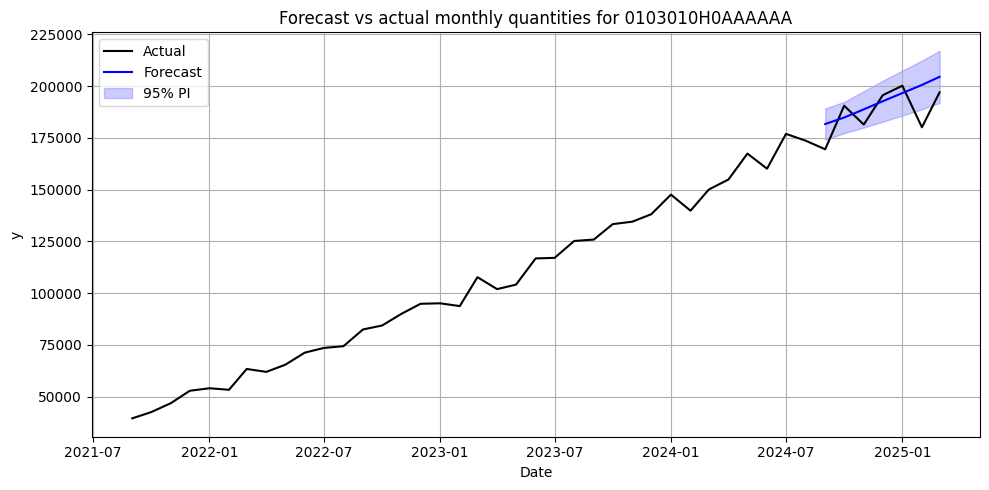

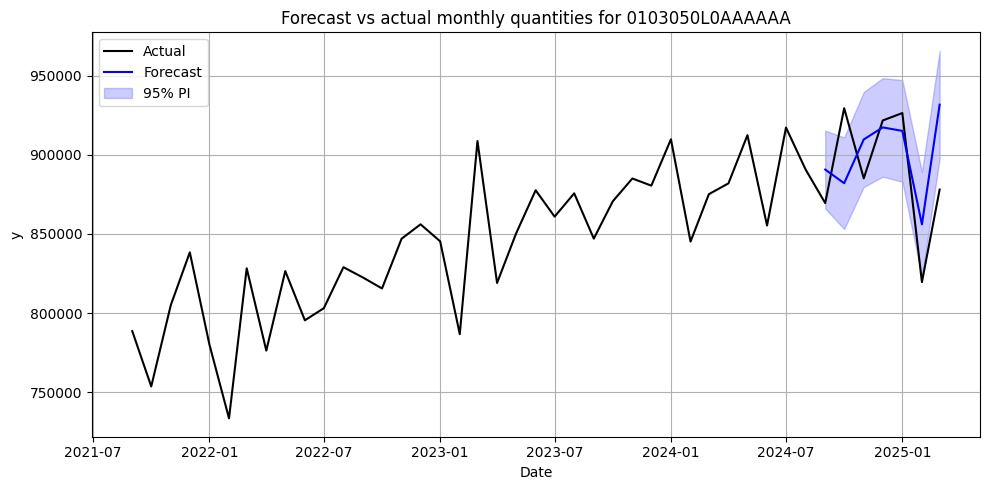

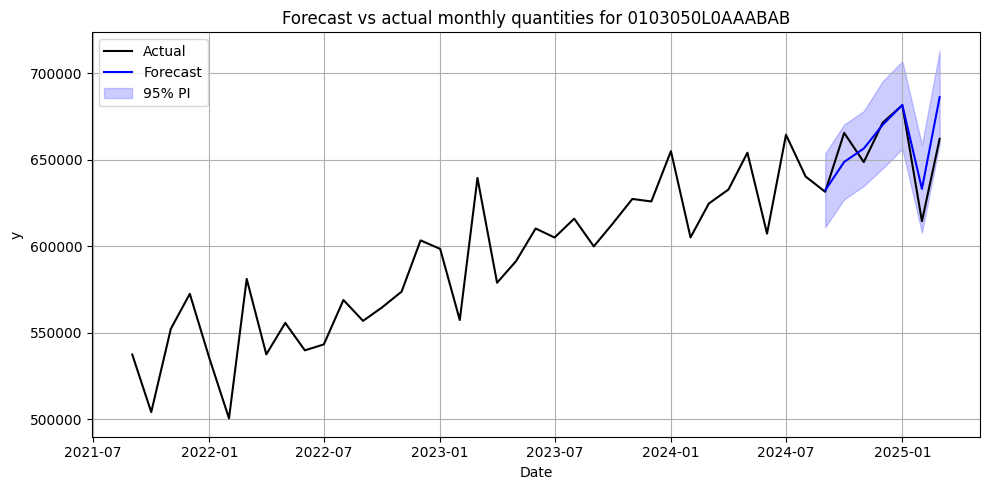

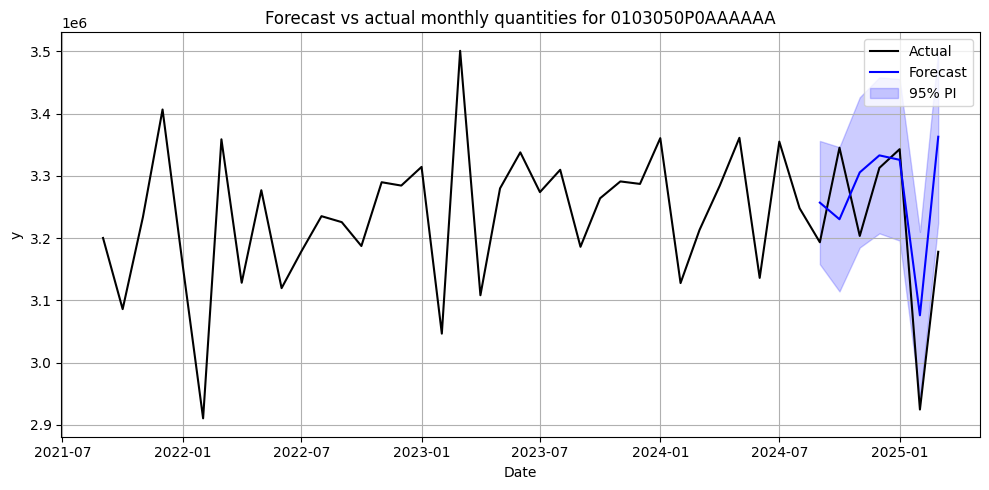

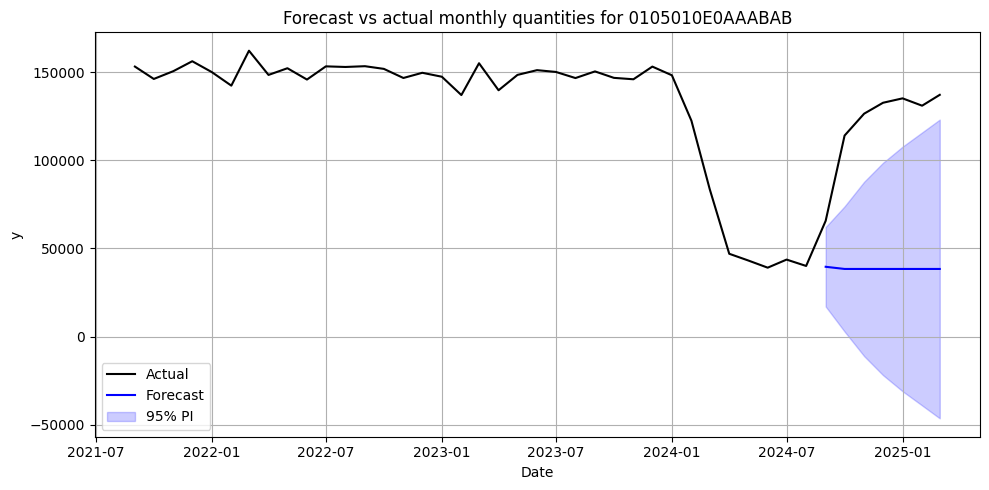

...

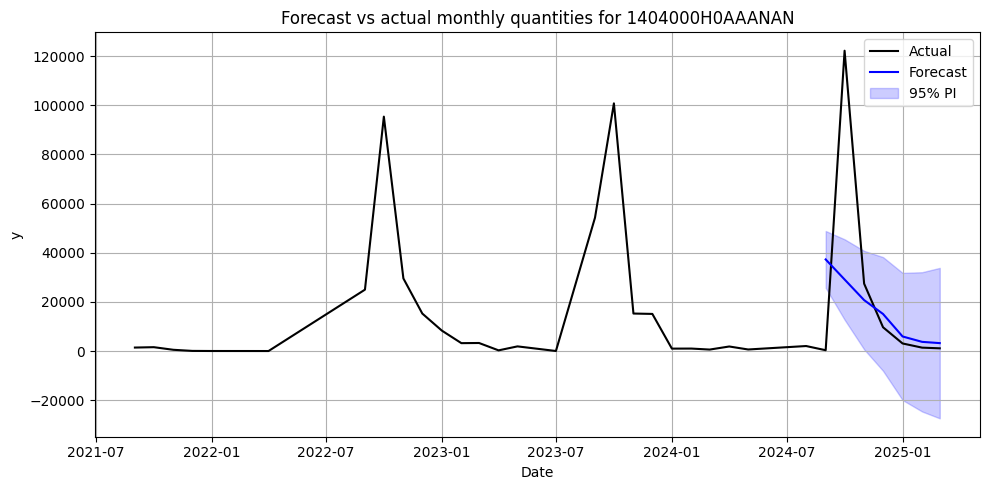

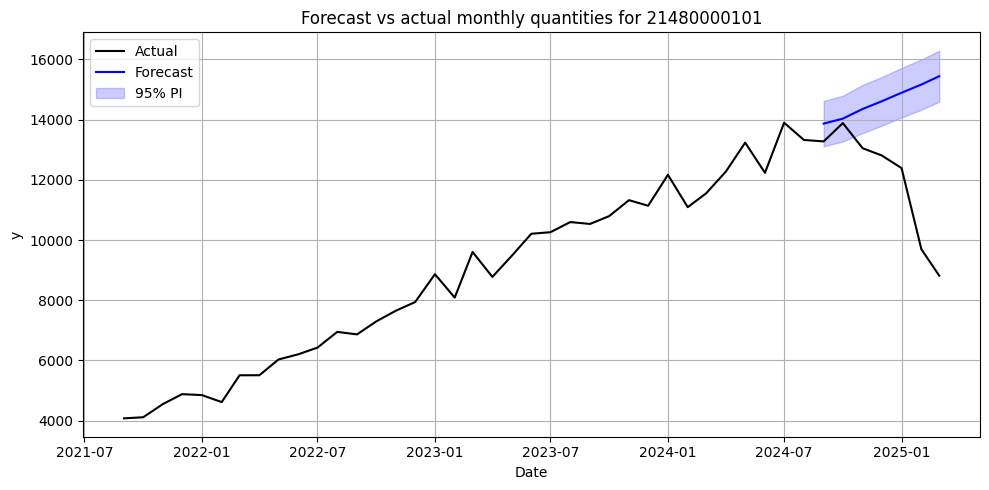

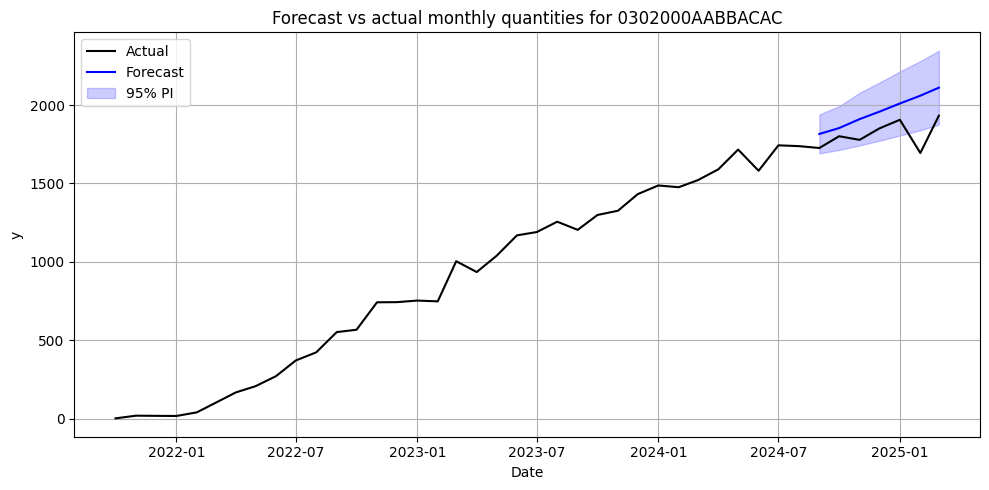

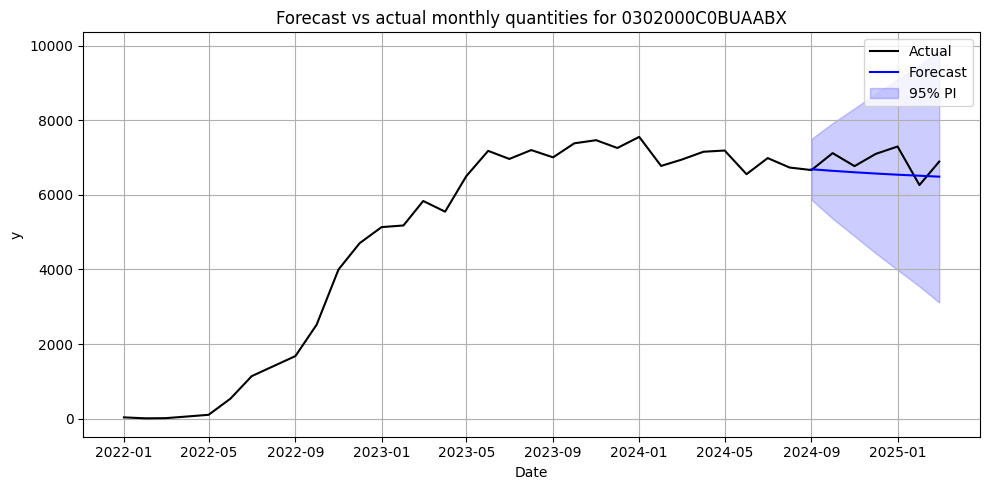

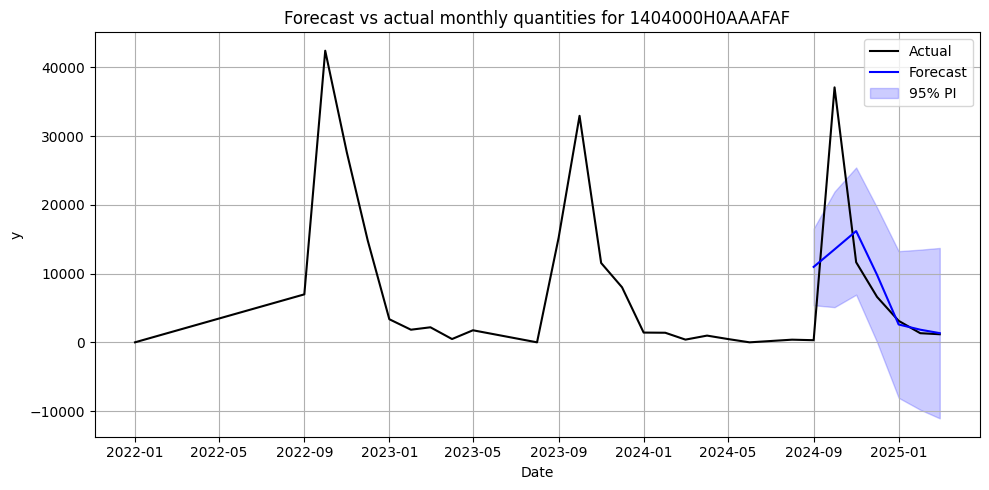

In [41]:
import matplotlib.pyplot as plt

for uid in merged_topx_rx_df['unique_id'].dropna().unique():
    df = merged_topx_rx_df[merged_topx_rx_df['unique_id'] == uid].sort_values('ds')

    plt.figure(figsize=(10, 5))
    plt.plot(df['ds'], df['y'], label='Actual', color='black')
    plt.plot(df['ds'], df['y_hat'], label='Forecast', color='blue')
    
    if 'y_hat_lower' in df and 'y_hat_upper' in df:
        plt.fill_between(df['ds'], df['y_hat_lower'], df['y_hat_upper'], color='blue', alpha=0.2, label='95% PI')

    plt.title(f"Forecast vs actual monthly quantities for {uid}")
    plt.xlabel("Date")
    plt.ylabel("y")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

OK, now we've got some quantity data, let's merge it with pricing data, and see how that looks.
Let's start by merging the actual vs forecast dataframe, with the price dataframe.

First though we need to filter the pricing data so it's only got the prices for the forecast in it, rather than training model as well (<span style="color: red"> *once again, for a final tool, do we need any prices further back than `start_forecast`*?</span>)

In [42]:
forecast_full_price_df = full_price_df[(full_price_df['month'] >= start_forecast) & (full_price_df['month'] <= end_forecast)]

In [43]:
merged_price_topx_rx_df = pd.merge(
    merged_topx_rx_df[['ds', 'unique_id', 'y', 'actual_cost', 'y_hat', 'y_hat_lower', 'y_hat_upper']],
    forecast_full_price_df[['month','bnf_code', 'dt_category','price_per_unit','pc_price_per_unit']],
    left_on=['ds', 'unique_id'],
    right_on=['month','bnf_code'],
    how='outer'
)
merged_price_topx_rx_df = merged_price_topx_rx_df.drop(columns=['month', 'bnf_code']) # remove duplicate columns

This looks like:

In [44]:
merged_price_topx_rx_df.head()

,ds,unique_id,y,actual_cost,y_hat,y_hat_lower,y_hat_upper,dt_category,price_per_unit,pc_price_per_unit
0,2021-09-01,0103010H0AAAAAA,"39,489.00","29,030.23",NaN,NaN,NaN,NaN,NaN,NaN
1,2021-09-01,0103050L0AAAAAA,"788,537.00","34,475.63",NaN,NaN,NaN,NaN,NaN,NaN
2,2021-09-01,0103050L0AAABAB,"537,353.00","18,958.43",NaN,NaN,NaN,NaN,NaN,NaN
3,2021-09-01,0103050P0AAAAAA,"3,200,129.00","116,929.90",NaN,NaN,NaN,NaN,NaN,NaN
4,2021-09-01,0105010E0AAABAB,"153,087.00","21,913.87",NaN,NaN,NaN,NaN,NaN,NaN


Next we want to create a price by multiplying the forecast quantity either by the price concession (if it exists) or the normal price per unit.  This is achieved using `fillna` (the pandas version of `COALESCE`) and dividing the value by 100 to get to pounds rather than pence. We can also do this for the lower and upper bounds.

In [45]:
merged_price_topx_rx_df['forecast_cost'] = (merged_price_topx_rx_df['y_hat']/100) * merged_price_topx_rx_df['pc_price_per_unit'].fillna(merged_price_topx_rx_df['price_per_unit'])
merged_price_topx_rx_df['forecast_cost_lower'] = (merged_price_topx_rx_df['y_hat_lower']/100) * merged_price_topx_rx_df['pc_price_per_unit'].fillna(merged_price_topx_rx_df['price_per_unit'])
merged_price_topx_rx_df['forecast_cost_upper'] = (merged_price_topx_rx_df['y_hat_upper']/100) * merged_price_topx_rx_df['pc_price_per_unit'].fillna(merged_price_topx_rx_df['price_per_unit'])

This gives us:

In [46]:
pd.set_option('display.float_format', '{:,.2f}'.format) # removes scientific location
merged_price_topx_rx_df.head()

,ds,unique_id,y,actual_cost,y_hat,y_hat_lower,y_hat_upper,dt_category,price_per_unit,pc_price_per_unit,forecast_cost,forecast_cost_lower,forecast_cost_upper
0,2021-09-01,0103010H0AAAAAA,"39,489.00","29,030.23",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-09-01,0103050L0AAAAAA,"788,537.00","34,475.63",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-09-01,0103050L0AAABAB,"537,353.00","18,958.43",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-09-01,0103050P0AAAAAA,"3,200,129.00","116,929.90",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-09-01,0105010E0AAABAB,"153,087.00","21,913.87",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


OK, let's plot it!

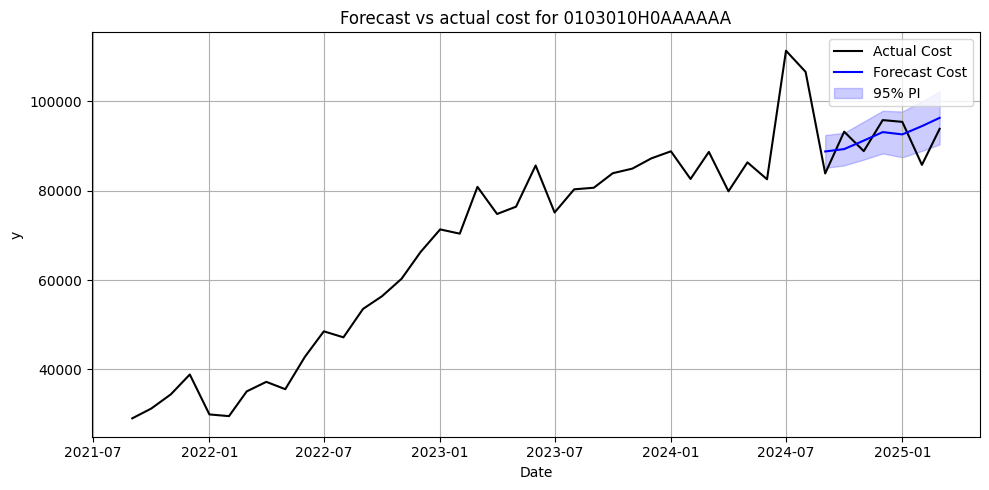

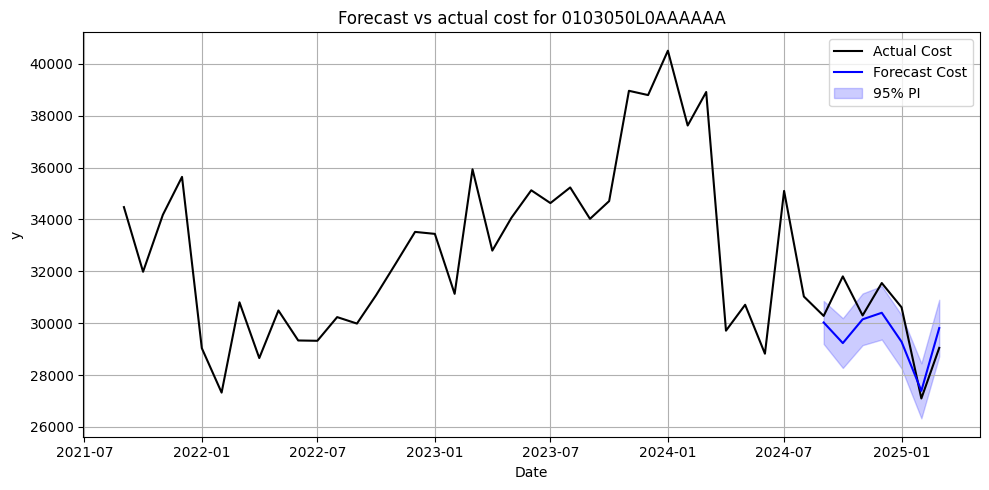

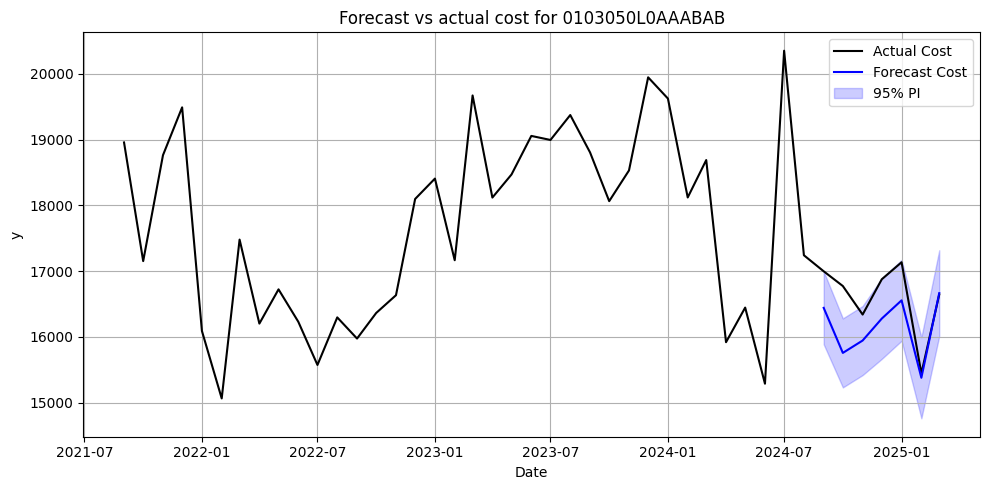

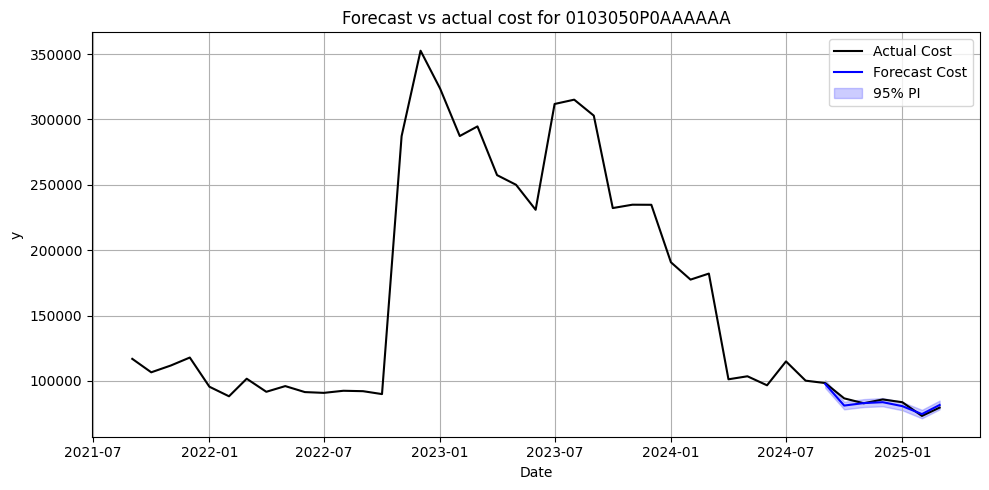

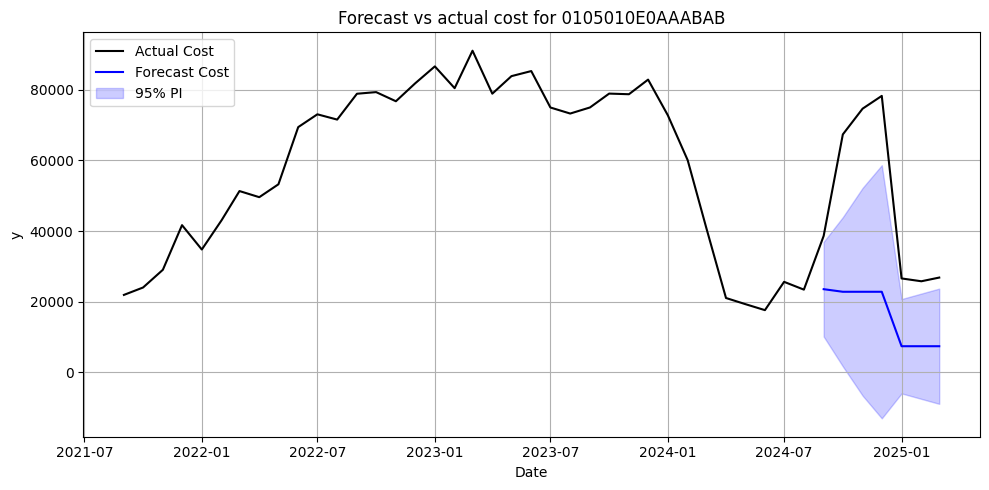

...

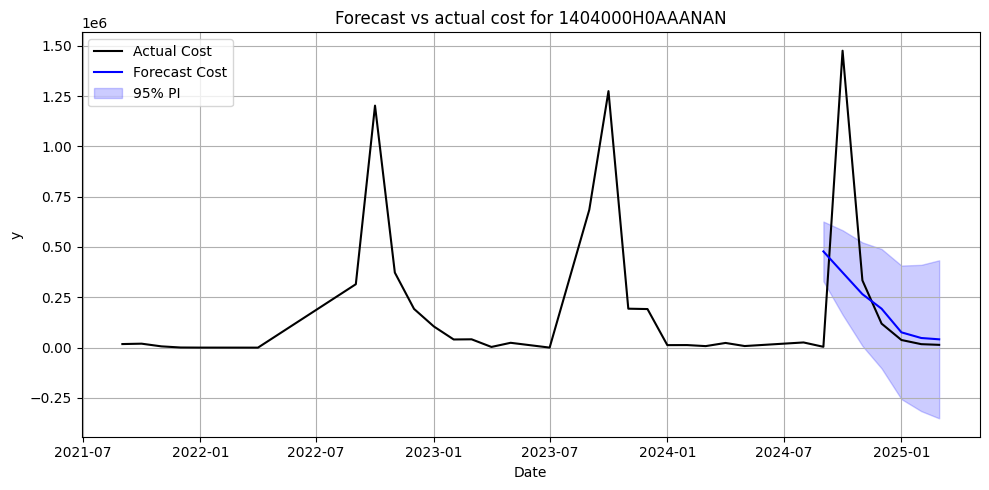

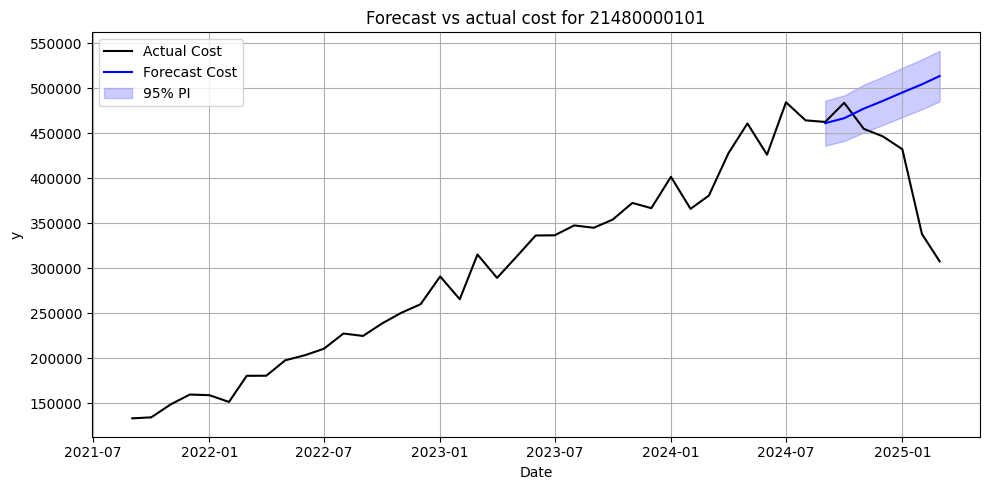

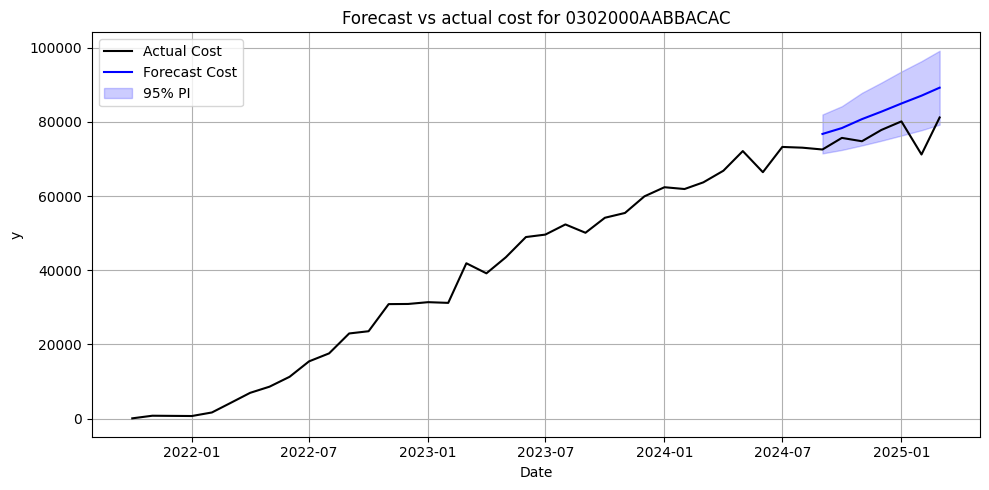

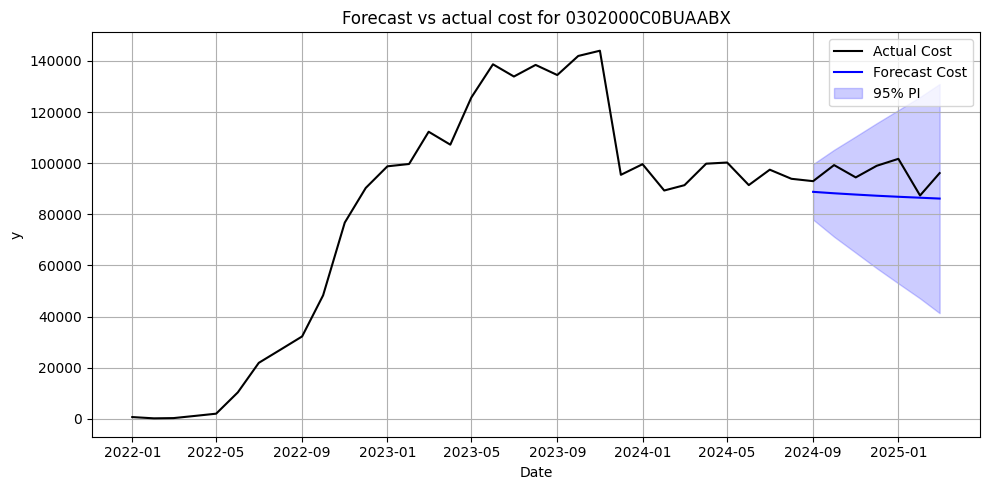

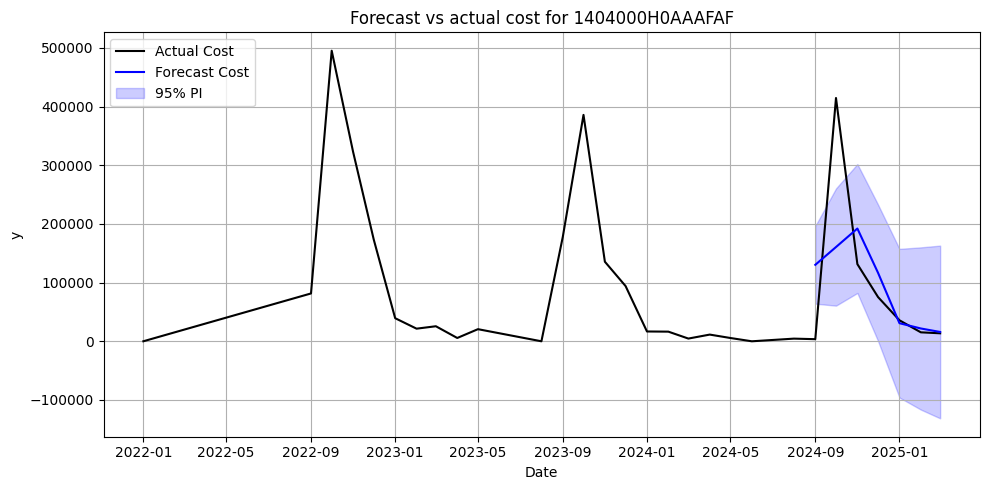

In [47]:
for uid in merged_price_topx_rx_df['unique_id'].dropna().unique():
    df = merged_price_topx_rx_df[merged_price_topx_rx_df['unique_id'] == uid].sort_values('ds')

    plt.figure(figsize=(10, 5))
    plt.plot(df['ds'], df['actual_cost'], label='Actual Cost', color='black')
    plt.plot(df['ds'], df['forecast_cost'], label='Forecast Cost', color='blue')
    
    if 'forecast_cost_lower' in df and 'forecast_cost_upper' in df:
        plt.fill_between(df['ds'], df['forecast_cost_lower'], df['forecast_cost_upper'], color='blue', alpha=0.2, label='95% PI')

    plt.title(f"Forecast vs actual cost for {uid}")
    plt.xlabel("Date")
    plt.ylabel("y")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

And FINALLY, what does it look like aggregated for the top x number of drugs.  We need to aggregate the top x data frame:

In [48]:
total_forecast_toprx_df = merged_price_topx_rx_df.groupby('ds')[['actual_cost', 'forecast_cost', 'forecast_cost_lower', 'forecast_cost_upper']].sum().reset_index()

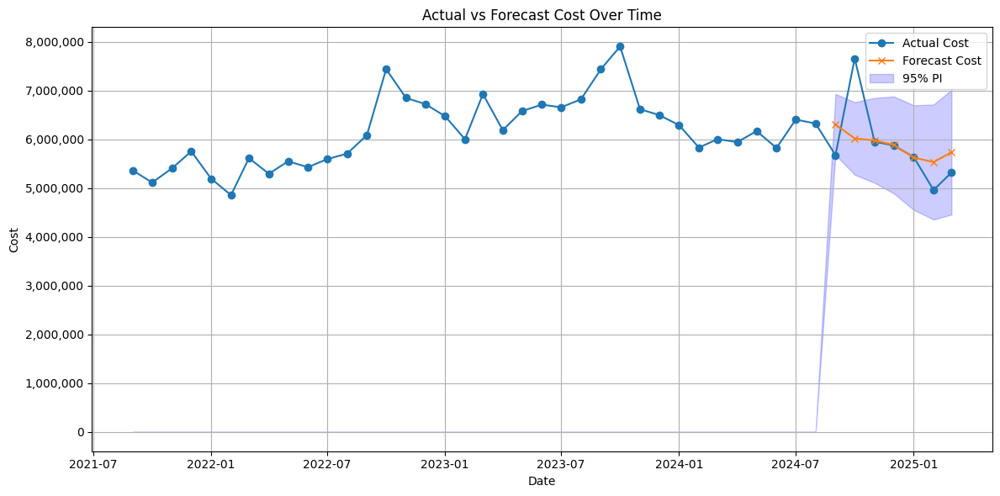

In [49]:
fig, ax = plt.subplots(figsize=(12, 6))

total_forecast_toprx_df.loc[total_forecast_toprx_df['forecast_cost'] == 0, 'forecast_cost'] = np.nan
ax.plot(total_forecast_toprx_df['ds'], total_forecast_toprx_df['actual_cost'], label='Actual Cost', marker='o')
ax.plot(total_forecast_toprx_df['ds'], total_forecast_toprx_df['forecast_cost'], label='Forecast Cost', marker='x')
if 'forecast_cost_lower' in total_forecast_toprx_df and 'forecast_cost_upper' in total_forecast_toprx_df:
    ax.fill_between(total_forecast_toprx_df['ds'], total_forecast_toprx_df['forecast_cost_lower'], total_forecast_toprx_df['forecast_cost_upper'], color='blue', alpha=0.2, label='95% PI')


ax.set_xlabel('Date')
ax.set_ylabel('Cost')
ax.set_title('Actual vs Forecast Cost Over Time')
ax.legend()
ax.grid(True)

# Disable scientific notation on y-axis
ax.yaxis.get_major_formatter().set_scientific(False)
ax.yaxis.set_major_formatter(mticker.StrMethodFormatter('{x:,.0f}'))

plt.tight_layout()
plt.show()

Let's do one more final final thing, let's look at cumulative spend JUST for the financial year we're interested in.  We need to filter the data, and aggregate it cumulatively. 

We also need to get the last cumulative `actual_cost` before the forecast begins, so that the forecast chart starts from the correct point!

In [50]:
cum_total_forecast_toprx_df = merged_price_topx_rx_df.groupby('ds')[['actual_cost', 'forecast_cost']].sum().reset_index() #aggregate
cum_total_forecast_toprx_df = cum_total_forecast_toprx_df[(cum_total_forecast_toprx_df['ds'] >= financial_year_start(end_forecast)) & (cum_total_forecast_toprx_df['ds'] <= end_forecast)] #filter to financial year
cum_total_forecast_toprx_df['cum_actual_cost'] = cum_total_forecast_toprx_df['actual_cost'].cumsum() # cumulative sum actual cost
cum_total_forecast_toprx_df['cum_forecast_cost'] = cum_total_forecast_toprx_df['forecast_cost'].cumsum() # cumulative sum forecast cost

# Get last cumulative actual cost before forecast starts
last_actual_before_forecast = cum_total_forecast_toprx_df.loc[cum_total_forecast_toprx_df['ds'] < start_forecast, 'cum_actual_cost'].max()
if pd.isna(last_actual_before_forecast):
    last_actual_before_forecast = 0  # handle if no actuals before forecast

# Create a mask for forecast dates and after
forecast_mask = cum_total_forecast_toprx_df['ds'] >= start_forecast

# Add last_actual_before_forecast as offset to cumulative forecast cost from forecast start onward
cum_total_forecast_toprx_df.loc[forecast_mask, 'cum_forecast_cost'] += last_actual_before_forecast
    
cum_total_forecast_toprx_df.loc[cum_total_forecast_toprx_df['cum_actual_cost'] == 0, 'cum_actual_cost'] = np.nan
cum_total_forecast_toprx_df.loc[cum_total_forecast_toprx_df['cum_forecast_cost'] == 0, 'cum_forecast_cost'] = np.nan

In [51]:
cum_total_forecast_toprx_df.head(12)

,ds,actual_cost,forecast_cost,cum_actual_cost,cum_forecast_cost
31,2024-04-01,"5,941,717.01",0.00,"5,941,717.01",NaN
32,2024-05-01,"6,168,062.13",0.00,"12,109,779.14",NaN
33,2024-06-01,"5,820,618.81",0.00,"17,930,397.95",NaN
34,2024-07-01,"6,403,974.17",0.00,"24,334,372.12",NaN
35,2024-08-01,"6,322,490.67",0.00,"30,656,862.79",NaN
36,2024-09-01,"5,673,614.78","6,304,044.27","36,330,477.57","36,960,907.07"
37,2024-10-01,"7,655,947.65","6,016,387.76","43,986,425.22","42,977,294.83"
38,2024-11-01,"5,949,207.34","5,976,698.72","49,935,632.56","48,953,993.55"
39,2024-12-01,"5,872,073.72","5,883,471.60","55,807,706.28","54,837,465.15"
40,2025-01-01,"5,636,526.51","5,624,190.86","61,444,232.78","60,461,656.01"


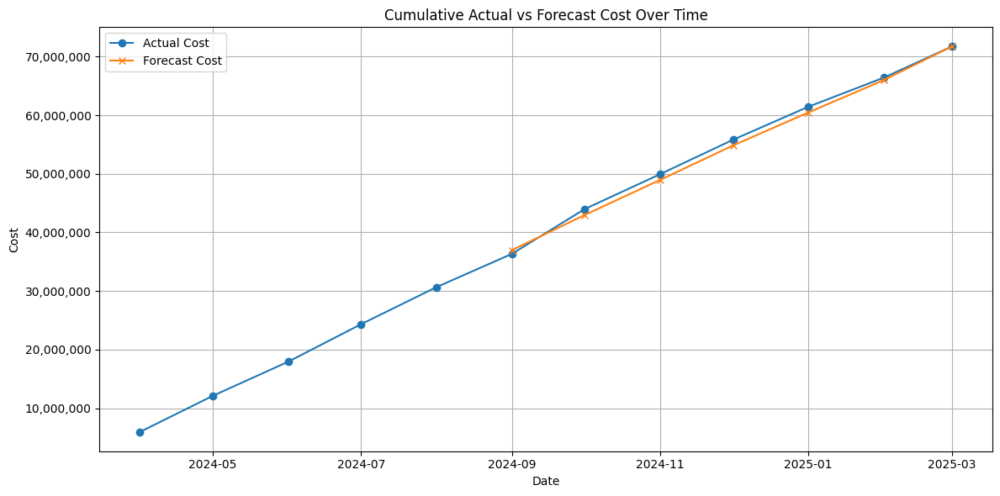

In [52]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(cum_total_forecast_toprx_df['ds'], cum_total_forecast_toprx_df['cum_actual_cost'], label='Actual Cost', marker='o')
ax.plot(cum_total_forecast_toprx_df['ds'], cum_total_forecast_toprx_df['cum_forecast_cost'], label='Forecast Cost', marker='x')

ax.set_xlabel('Date')
ax.set_ylabel('Cost')
ax.set_title('Cumulative Actual vs Forecast Cost Over Time')
ax.legend()
ax.grid(True)

# Disable scientific notation on y-axis
ax.yaxis.get_major_formatter().set_scientific(False)
ax.yaxis.set_major_formatter(mticker.StrMethodFormatter('{x:,.0f}'))

plt.tight_layout()
plt.show()